In [4]:
#!pip install pandas numpy streamlit plotly


  Using cached streamlit-1.40.1-py2.py3-none-any.whl.metadata (8.5 kB)
  Using cached plotly-5.24.1-py3-none-any.whl.metadata (7.3 kB)
  Using cached altair-5.5.0-py3-none-any.whl.metadata (11 kB)
  Using cached blinker-1.9.0-py3-none-any.whl.metadata (1.6 kB)
  Using cached cachetools-5.5.0-py3-none-any.whl.metadata (5.3 kB)
  Using cached protobuf-5.28.3-cp310-abi3-win_amd64.whl.metadata (592 bytes)
  Using cached pyarrow-18.0.0-cp312-cp312-win_amd64.whl.metadata (3.4 kB)
  Using cached rich-13.9.4-py3-none-any.whl.metadata (18 kB)
  Using cached tenacity-9.0.0-py3-none-any.whl.metadata (1.2 kB)
  Using cached toml-0.10.2-py2.py3-none-any.whl.metadata (7.1 kB)
  Using cached GitPython-3.1.43-py3-none-any.whl.metadata (13 kB)
  Using cached pydeck-0.9.1-py2.py3-none-any.whl.metadata (4.1 kB)
  Using cached watchdog-6.0.0-py3-none-win_amd64.whl.metadata (44 kB)
  Using cached narwhals-1.14.2-py3-none-any.whl.metadata (7.5 kB)
  Using cached typing_extensions-4.12.2-py3-none-any.whl.met


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [24]:
import pandas as pd
import numpy as np
import streamlit as st
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
#Load the data
df = pd.read_csv("../data/processed/Data_Science_Challenge.csv")


In [15]:
pd.set_option('display.max_columns', None)
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [10]:
df.describe()


,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [12]:
#Check for missing values
df.isnull().sum()


state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [13]:
df.duplicated().sum()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn


In [14]:
df.nunique()


state                       51
account length             212
area code                    3
phone number              3333
international plan           2
voice mail plan              2
number vmail messages       46
total day minutes         1667
total day calls            119
total day charge          1667
total eve minutes         1611
total eve calls            123
total eve charge          1440
total night minutes       1591
total night calls          120
total night charge         933
total intl minutes         162
total intl calls            21
total intl charge          162
customer service calls      10
churn                        2
dtype: int64

In [16]:
# Exploratory Data Analysis

#Univariate Analysis with histograms

for col in df.select_dtypes(include=['int64', 'float64']).columns:
    fig = px.histogram(df, x=col, nbins=30, title=f'Histogram of {col}')
    fig.update_layout(xaxis_title=col, yaxis_title='Frequency', bargap=0.1)
    fig.show()




In [17]:
'''
Most of the features are normally distributed however there are some features that are skewed.
The features that are right skewed include
1. Total international calls
2. Number of customer service calls
'''

''

In [21]:
# Using boxplots to identify outliers
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
df_melted = df.melt(value_vars=numerical_cols, var_name='Variable', value_name='Value')
fig = px.box(df_melted, x='Variable', y='Value', points='outliers', title='Boxplots for all Variables')
fig.update_layout(
    xaxis_title='Variables',
    yaxis_title='Values',
    xaxis={'tickangle': 45},
    boxmode='group'
)
fig.show()

In [22]:
# Getting counts of outliers

numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

outlier_counts = {}

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)  
    Q3 = df[col].quantile(0.75)  
    IQR = Q3 - Q1                
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    outlier_counts[col] = len(outliers)

for col, count in outlier_counts.items():
    print(f"Column: {col}, Number of Outliers: {count}")


Column: account length, Number of Outliers: 18
Column: area code, Number of Outliers: 0
Column: number vmail messages, Number of Outliers: 1
Column: total day minutes, Number of Outliers: 25
Column: total day calls, Number of Outliers: 23
Column: total day charge, Number of Outliers: 25
Column: total eve minutes, Number of Outliers: 24
Column: total eve calls, Number of Outliers: 20
Column: total eve charge, Number of Outliers: 24
Column: total night minutes, Number of Outliers: 30
Column: total night calls, Number of Outliers: 22
Column: total night charge, Number of Outliers: 30
Column: total intl minutes, Number of Outliers: 46
Column: total intl calls, Number of Outliers: 78
Column: total intl charge, Number of Outliers: 49
Column: customer service calls, Number of Outliers: 267


In [23]:
# There are quite a few outliers in the variables however, we will deal with them depending on their correlation so we can accordingly transform or remove them.


churn
True     138
False    129
Name: count, dtype: int64


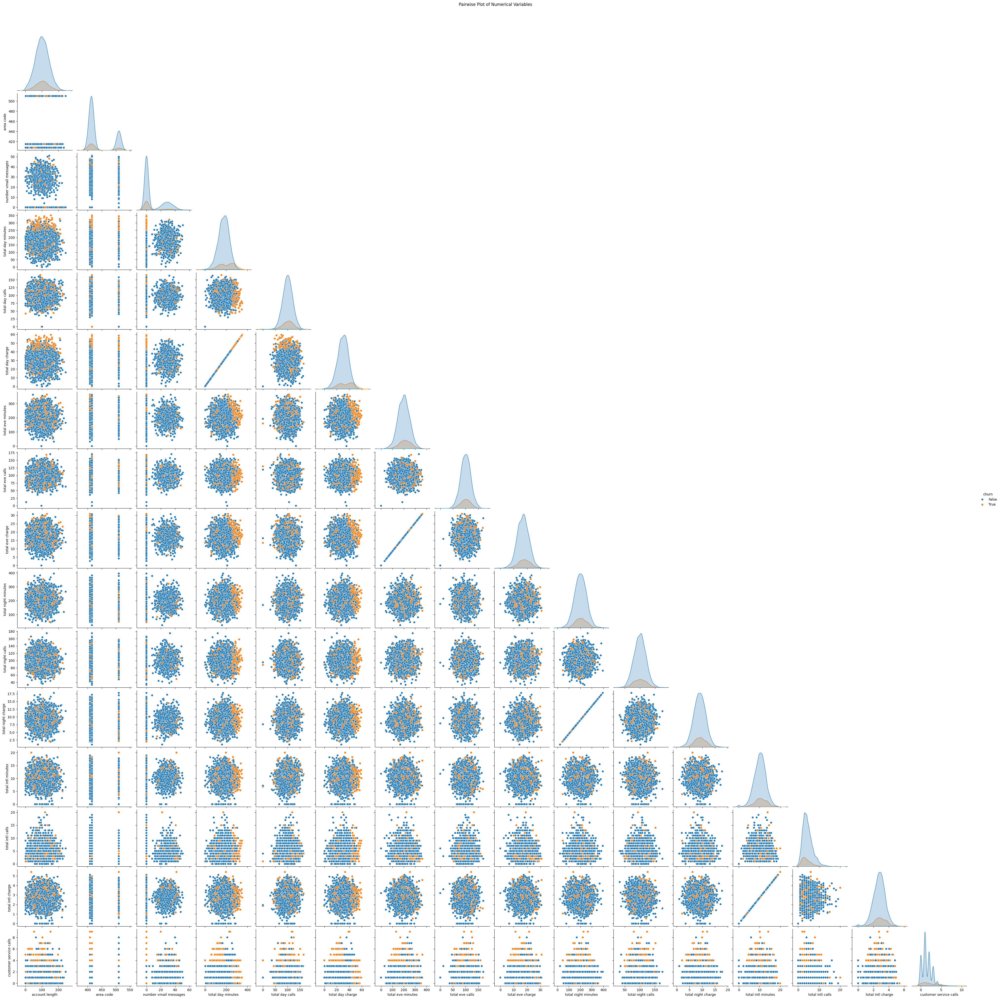

In [42]:
# Bivariate Analysis and Correlation Matrix
imp_cols = df[numerical_cols].assign(churn=df['churn'])
%matplotlib inline
sns.pairplot(imp_cols, diag_kind='kde', corner=True, hue='churn')
plt.suptitle('Pairwise Plot of Numerical Variables', y=1.02)
plt.show()


In [ ]:
'''
1. We can see that some variables are correlated with each other such as total day charge and total day minutes, total eve charge and total eve minutes, total night charge and total night minutes, total international charge and total international minutes.
2. Some variables are not normal distributed and have multiple peaks possibly suggesting grouping such as number of voicemail messages and customer service calls
'''

In [34]:
correlation_matrix = df[numerical_cols].corr()

fig = px.imshow(
    correlation_matrix,
    text_auto=".2f",  # Add annotations with 2 decimal places
    color_continuous_scale="RdBu",  # Red-Blue color scale for contrast
    title="Correlation Heatmap",
    labels=dict(color="Correlation"),  # Add a color bar label
)

fig.update_layout(
    title_font_size=18,
    title_x=0.5,  # Center the title
    xaxis=dict(tickangle=45),  # Rotate x-axis labels for readability
    coloraxis_colorbar=dict(
        title="Correlation Coefficient",  # Color bar title
        tickvals=[-1, -0.5, 0, 0.5, 1],  # Define ticks for the color bar
        ticktext=["-1 (Negative)", "-0.5", "0 (None)", "0.5", "1 (Positive)"],  # Label ticks
    ),
    width=900,  # Adjust the width of the heatmap
    height=700,  # Adjust the height
)

fig.show()


In [35]:
# For better readability, we will only show the lower triangle of the correlation matrix
# Step 1: Mask the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))  # Upper triangle mask
correlation_matrix_masked = correlation_matrix.mask(mask)  # Apply the mask

# Step 2: Plot the heatmap
fig = px.imshow(
    correlation_matrix_masked,
    text_auto=".2f",  # Show values with 2 decimal places
    color_continuous_scale="RdBu",
    title="Correlation Heatmap (Lower Triangle Only)",
    labels=dict(color="Correlation"),
)

fig.update_layout(
    title_font_size=18,
    title_x=0.5,  # Center the title
    xaxis=dict(tickangle=45),  # Rotate x-axis labels
    coloraxis_colorbar=dict(
        title="Correlation Coefficient",
        tickvals=[-1, -0.5, 0, 0.5, 1],
        ticktext=["-1 (Negative)", "-0.5", "0 (None)", "0.5", "1 (Positive)"],
    ),
    width=800,
    height=800,
)

fig.show()

In [43]:
# The relationship between variables observed in the correlation matrix is consistent with the pairplot.
# However, upon looking at the distributions with churn as a feature, we can see that the dataset is imbalanced. To confirm this we look at the distribution of churn.


In [44]:
churn_distribution = df['churn'].value_counts(normalize=True)
print(churn_distribution)


churn
False    0.855086
True     0.144914
Name: proportion, dtype: float64


In [45]:
# 86% of customers did not churn while 14% of customers churned.


In [46]:
# Using boxplots to compare numerical features by churn
for col in numerical_cols:
    fig = px.box(df, x='churn', y=col, color='churn', 
                 title=f'Distribution of {col} by Churn',
                 labels={'churn': 'Churn', col: col})
    fig.update_traces(quartilemethod="exclusive") 
    fig.show()